<a href="https://colab.research.google.com/github/lugoll/hr_employee_attrition/blob/main/HR_Employee_Attrition_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The reasons employees quit

Employee fluctuation will be explained by the [IBM HR Analytics Employee Attrition and Performance](https://www.kaggle.com/pavansubhasht/ibm-hr-analytics-attrition-dataset) Dataset.

The following questions will be answered: 

1.   Is it possible to create a model to determine employee attrition with an accuracy of at lest 80%?
2.   Which attributes have the most most negative and positive impact on the outcome?





Unfortunately, pandas-profiling version 1.4.1, which is installed, is incompatible with pandas 1.X. So let's fix this first for google colab.

In [ ]:
!pip freeze | grep pandas-profiling

pandas-profiling==1.4.1


Upgrading pandas-profiling:

*Some Errors might occur, but they can be ignored*

In [ ]:
!pip install --upgrade pandas-profiling >/dev/null

ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.25.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.


Imports:

In [ ]:
import pandas as pd
import numpy as np

from pandas_profiling import ProfileReport

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, plot_confusion_matrix, plot_roc_curve

from matplotlib import pyplot as plt

print('Imports successful')

Imports successful


Loading Data:

In [ ]:
fp = 'drive/My Drive/BigDataSeminararbeit/HR-Employee-Attrition.csv'
df = pd.read_csv(fp)
shape = df.shape

print(f'{shape[0]} entries')
print(f'{shape[1]} attributes')

1470 entries
35 attributes


## Data Understanding

Let's get a quick overview of the data

In [ ]:
df.describe(include='all')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470,1470,1470.000000,1470,1470.000000,1470.000000,1470,1470.0,1470.000000,1470.000000,1470,1470.000000,1470.000000,1470.000000,1470,1470.000000,1470,1470.000000,1470.000000,1470.000000,1470,1470,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
unique,NaN,2,3,NaN,3,NaN,NaN,6,NaN,NaN,NaN,2,NaN,NaN,NaN,9,NaN,3,NaN,NaN,NaN,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,No,Travel_Rarely,NaN,Research & Development,NaN,NaN,Life Sciences,NaN,NaN,NaN,Male,NaN,NaN,NaN,Sales Executive,NaN,Married,NaN,NaN,NaN,Y,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1233,1043,NaN,961,NaN,NaN,606,NaN,NaN,NaN,882,NaN,NaN,NaN,326,NaN,673,NaN,NaN,NaN,1470,1054,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,36.923810,NaN,NaN,802.485714,NaN,9.192517,2.912925,NaN,1.0,1024.865306,2.721769,NaN,65.891156,2.729932,2.063946,NaN,2.728571,NaN,6502.931293,14313.103401,2.693197,NaN,NaN,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,NaN,NaN,403.509100,NaN,8.106864,1.024165,NaN,0.0,602.024335,1.093082,NaN,20.329428,0.711561,1.106940,NaN,1.102846,NaN,4707.956783,7117.786044,2.498009,NaN,NaN,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,NaN,NaN,102.000000,NaN,1.000000,1.000000,NaN,1.0,1.000000,1.000000,NaN,30.000000,1.000000,1.000000,NaN,1.000000,NaN,1009.000000,2094.000000,0.000000,NaN,NaN,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,NaN,NaN,465.000000,NaN,2.000000,2.000000,NaN,1.0,491.250000,2.000000,NaN,48.000000,2.000000,1.000000,NaN,2.000000,NaN,2911.000000,8047.000000,1.000000,NaN,NaN,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,NaN,NaN,802.000000,NaN,7.000000,3.000000,NaN,1.0,1020.500000,3.000000,NaN,66.000000,3.000000,2.000000,NaN,3.000000,NaN,4919.000000,14235.500000,2.000000,NaN,NaN,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,NaN,NaN,1157.000000,NaN,14.000000,4.000000,NaN,1.0,1555.750000,4.000000,NaN,83.750000,3.000000,3.000000,NaN,4.000000,NaN,8379.000000,20461.500000,4.000000,NaN,NaN,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000


So it is shown, that some attributes from the dataset can be eliminated.

In [ ]:
attributes_to_drop = ['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours']

df_small = df.drop(attributes_to_drop, axis=1)
df_small.shape

(1470, 31)

For better data understanding the pandas-profiling package will be used.

In [ ]:
report = ProfileReport(df_small)
report

Summarize dataset:   0%|          | 0/44 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Attributes with high correlation:

- MonthlyIncome - JobLevel
- Department - JobRole

The Following Attributes are nominal:

In [ ]:
list(df_small.select_dtypes(include='object').columns)

['Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

Scales and Outliers:

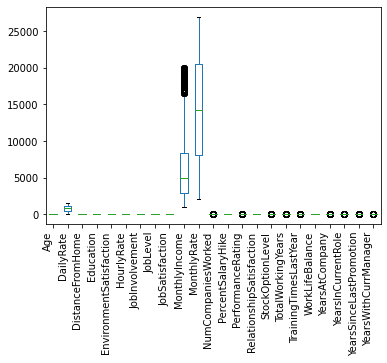

In [ ]:
df_tmp = df_small.select_dtypes(include='int')
ax = df_tmp.plot.box()
ax.set_xticklabels(list(df_tmp.columns), rotation=90, ha='right')
ax

Scales and Outliers without DailyRate, MonthlyRate, HourlyRate and MonthlyIncome

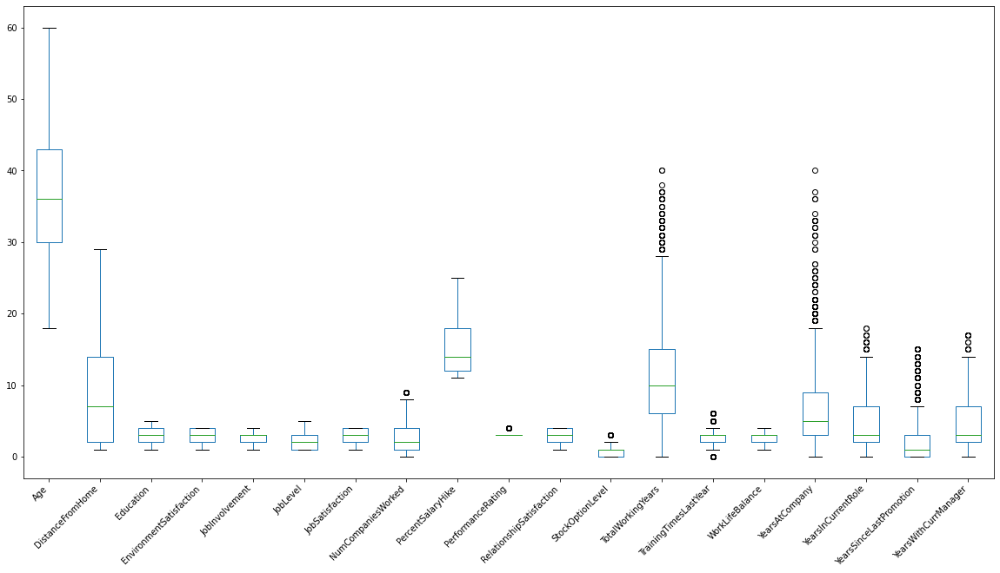

In [ ]:
df_tmp = df_small.select_dtypes(include='int').drop(['MonthlyRate', 'MonthlyIncome', 'DailyRate', 'HourlyRate'], axis=1)
ax = df_tmp.plot.box(figsize=(20, 10))
ax.set_xticklabels(list(df_tmp.columns), rotation=45, ha='right')
ax

Very different scales, especially with MonthlyRate, MonthlyIncome and DailyRate.

Despite there are few outliers, they don't seem to be unusual or impossibles, so let's keep them in the data.

Fortunately there are no missing values in the dataset.

## Data Preperation 1

The next step is remove the correlation in the data to reduce model complexity. 

In [ ]:
df_clean = df_small.drop(['JobRole', 'JobLevel'], axis=1)
df_clean.shape

(1470, 29)

Now splitting the dependent and the independent variables

In [ ]:
y = df_clean['Attrition']
df_clean.drop('Attrition', axis=1, inplace=True)
y.head()

0    Yes
1     No
2    Yes
3     No
4     No
Name: Attrition, dtype: object

Now encode categorial values

In [ ]:
df_onehot = pd.get_dummies(df_clean)
df_onehot['Attrition'] = y
print(f'{df_onehot.shape[1]} attributes in dataset')
df_onehot.head()

42 attributes in dataset


,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,OverTime_No,OverTime_Yes,Attrition
0,41,1102,1,2,2,94,3,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,Yes
1,49,279,8,1,3,61,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,No
2,37,1373,2,2,4,92,2,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,1,Yes
3,33,1392,3,4,4,56,3,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,No
4,27,591,2,1,1,40,3,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,1,0,No


At least splitting train and test data

In [ ]:
X = df_onehot.drop('Attrition', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=21) 

Splitted data with 25% test data

In [ ]:
all_train = len(y_train)
train_pos = y_train[y_train == 'Yes'].shape[0]
train_neg = y_train[y_train == 'No'].shape[0]

all_test = len(y_test)
test_pos = y_test[y_test == 'Yes'].shape[0]
test_neg = y_test[y_test == 'No'].shape[0]

print("Positive Category in Training-Data: {} ({:.2f} %)".format(train_pos, train_pos/all_train*100))
print("Negative Category in Training-Data: {} ({:.2f} %) \n".format(train_neg, train_neg/all_train*100))
print("Positive Category in Test-Data: {} ({:.2f} %)".format(test_pos, test_pos/all_test*100))
print("Negative Category in Test-Data: {} ({:.2f} %)".format(test_neg, test_neg/all_test*100))

Positive Category in Training-Data: 180 (16.33 %)
Negative Category in Training-Data: 922 (83.67 %) 

Positive Category in Test-Data: 57 (15.49 %)
Negative Category in Test-Data: 311 (84.51 %)


## Modelling 1

For modelling a pipline will be used, which combines the standardization of the data and the model itself.

In [ ]:
pipeline = Pipeline([('scaler', StandardScaler()), ('logistic', LogisticRegression())])

Now the optimal Parameter for the regularization parameter C must be found, the follwing options will be tested via GridSearch, which runs a Cross Validation for every combination. 

Smaller values specify stronger regularization.

In [ ]:
param_grid = {
    'logistic__C' : [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500, 1000]
}

Now apply the GridSearch and finde the best parameter:

In [ ]:
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=4)
grid.fit(X_train, y_train)
print("Bester Score: {}".format(grid.best_score_))
print("Prameter for Regularization: {}".format(grid.best_params_['logistic__C']))

Bester Score: 0.8765744400527009
Prameter for Regularization: 0.05


Visualization of the tested parameters:

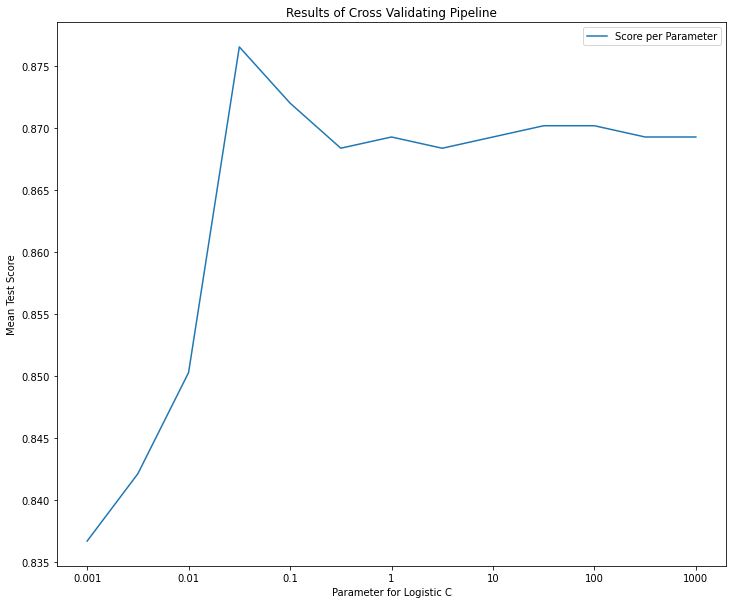

In [ ]:
params = (str(el['logistic__C']) for el in grid.cv_results_['params'])
mean_score = grid.cv_results_['mean_test_score']

result = pd.DataFrame(mean_score)
result.index = params
result.columns = ['Score per Parameter']

ax = result.plot.line(
    figsize=(12,10),
    xlabel="Parameter for Logistic C",
    ylabel="Mean Test Score",
    title="Results of Cross Validating Pipeline"
)

Now a model with the optimal parameters can be created:

In [ ]:
model = Pipeline([('scaler', StandardScaler()), ('logistic', LogisticRegression(C=0.05))])
model.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('logistic',
                 LogisticRegression(C=0.05, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

## Evaluation 1

Firstly predict test_values:

In [ ]:
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)

Confusion Matrix:

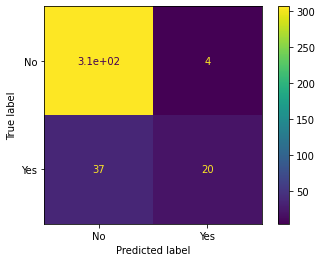

In [ ]:
plot_confusion_matrix(model, X_test, y_test)

ROC-Curve:

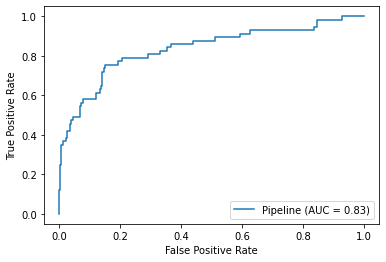

In [ ]:
plot_roc_curve(model, X_test, y_test)

Fortunately for evaluation the classification report contains a bit more information:

In [ ]:
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

          No       0.89      0.99      0.94       311
         Yes       0.83      0.35      0.49        57

    accuracy                           0.89       368
   macro avg       0.86      0.67      0.72       368
weighted avg       0.88      0.89      0.87       368



Unfortunately this model isn't that good and 37 out of 57 with attrition = yes get misclassified, this might be caused due to the inbalance of the predicted classes. So maybe this could be fixed.



## Data Preperation 2

In [ ]:
df_attrition_no = df_onehot[df_onehot['Attrition'] == 'No']
df_attrition_yes = df_onehot[df_onehot['Attrition'] == 'Yes']

attrition_no_count = df_attrition_no.shape[0]
attrition_yes_count = df_attrition_yes.shape[0]

print(f'{attrition_no_count} samples with Attrition = No')
print(f'{attrition_yes_count} samples with Attrition = Yes')

1233 samples with Attrition = No
237 samples with Attrition = Yes


Let's try oversampling the yes-class of attrition

In [ ]:
df_attrition_yes_over = df_attrition_yes.sample(attrition_no_count, replace=True, random_state=42)
df_onehot_over = pd.concat([df_attrition_no, df_attrition_yes_over], axis=0)

print(f'Random-Oversampling up to {df_onehot_over.shape[0]} entries')

Random-Oversampling up to 2466 entries


Splitting training and testing data again

In [ ]:
y = df_onehot_over['Attrition']
X = df_onehot_over.drop('Attrition', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=21) 

## Modelling 2

Creating a model with the new sampled data:


In [ ]:
pipeline = Pipeline([('scaler', StandardScaler()), ('logistic', LogisticRegression())])
param_grid = {
    'logistic__C' : [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500, 1000]
}

And now the GridSearch:

In [ ]:
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=4)
grid.fit(X_train, y_train)
print("Bester Score: {}".format(grid.best_score_))
print("Prameter for Regularization: {}".format(grid.best_params_['logistic__C']))

Bester Score: 0.7528412012753265
Prameter for Regularization: 0.01


It seems, that something is different:

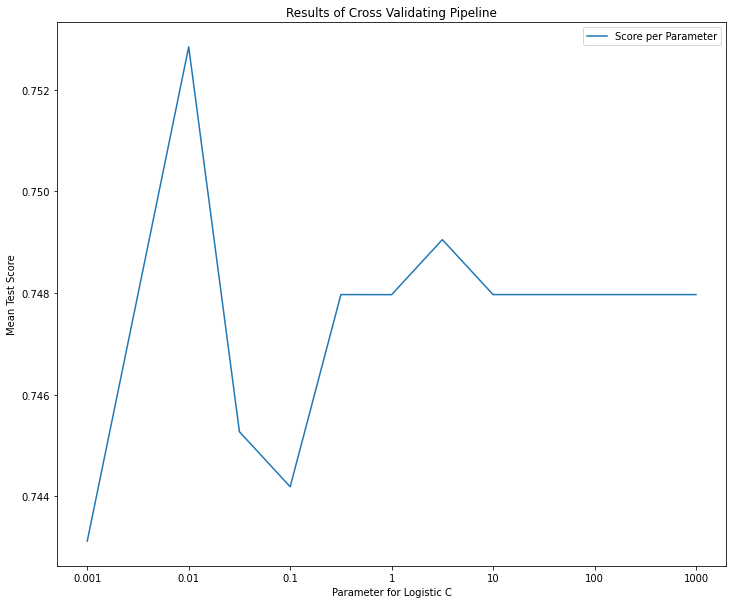

In [ ]:
params = (str(el['logistic__C']) for el in grid.cv_results_['params'])
mean_score = grid.cv_results_['mean_test_score']

result = pd.DataFrame(mean_score)
result.index = params
result.columns = ['Score per Parameter']

ax = result.plot.line(
    figsize=(12,10),
    xlabel="Parameter for Logistic C",
    ylabel="Mean Test Score",
    title="Results of Cross Validating Pipeline"
)

Finish the model based on the new sampled data:

In [ ]:
model = Pipeline([('scaler', StandardScaler()), ('logistic', LogisticRegression(C=0.05))])
model.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('logistic',
                 LogisticRegression(C=0.05, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

## Evaluation 2

Firstly predict some values again:

In [ ]:
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)

Confusion Matrix:

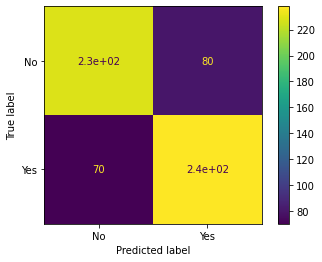

In [ ]:
plot_confusion_matrix(model, X_test, y_test)

ROC-Curve:

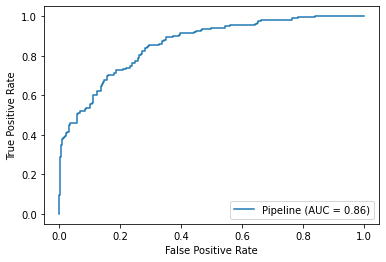

In [ ]:
plot_roc_curve(model, X_test, y_test)

Classification Report:

In [ ]:
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

          No       0.77      0.74      0.75       309
         Yes       0.75      0.77      0.76       308

    accuracy                           0.76       617
   macro avg       0.76      0.76      0.76       617
weighted avg       0.76      0.76      0.76       617



Compared to the previos model the metrics look quite good. 
The accurcy is a bit worse, but the other metrics has been improved a lot.

## Results

To question one:
- Question one can be answered with yes as well as with no. 
Yes it is possible to create an model with more than 80% accuracy, but on the given dataset, this doesn't mean that this is a good model. Due to the imbalance of the attrition-classes always guessing 'No' would result in an accuracy of round about 84%. 
- A model based on balanced data achieved better results, but only with an accuracy of 75% , which is also not bad. 
- Due to the better metrics aside of the accuracy model two will be used to answer question two.

Top 3 positive and negative coefficients:

In [ ]:
df_coefs = pd.DataFrame()
df_coefs['Coefficient'] = model.named_steps['logistic'].coef_[0]
df_coefs['Attribute Name'] = list(X.columns)

df_coef_top = pd.concat([df_coefs.nlargest(3,'Coefficient'), df_coefs.nsmallest(3, 'Coefficient')])
df_coef_top

,Coefficient,Attribute Name
18,0.477025,YearsAtCompany
40,0.388794,OverTime_Yes
20,0.379041,YearsSinceLastPromotion
4,-0.449104,EnvironmentSatisfaction
21,-0.418462,YearsWithCurrManager
19,-0.400340,YearsInCurrentRole


Calculate changes in odds-Ratio:

In [ ]:
df_coef_top['Odds Ratio Change'] = df_coef_top['Coefficient'].apply(lambda x: np.exp(x))
df_coef_top

,Coefficient,Attribute Name,Odds Ratio Change
18,0.477025,YearsAtCompany,1.611273
40,0.388794,OverTime_Yes,1.475200
20,0.379041,YearsSinceLastPromotion,1.460883
4,-0.449104,EnvironmentSatisfaction,0.638199
21,-0.418462,YearsWithCurrManager,0.658058
19,-0.400340,YearsInCurrentRole,0.670092


Visualize the impoct of the top attributes:

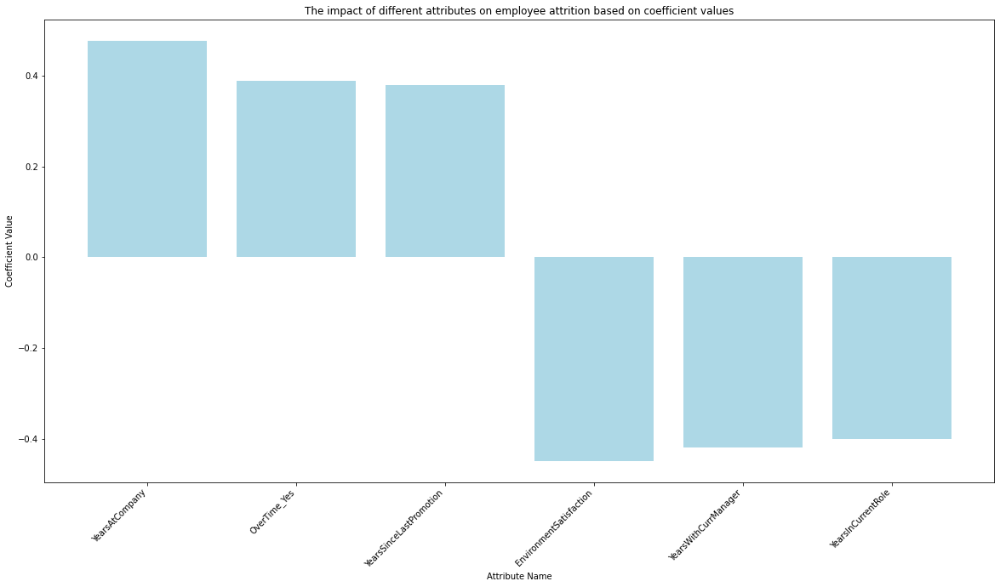

In [ ]:
# Diagram about coefs and impact
fig, ax = plt.subplots(figsize=(20, 10)) 

ax.bar(
    df_coef_top['Attribute Name'], 
    df_coef_top['Coefficient'],
    color='lightblue'
)
ax.set_xlabel("Attribute Name")
ax.set_ylabel("Coefficient Value")
ax.set_title("The impact of different attributes on employee attrition based on coefficient values")
ax.set_xticklabels(df_coef_top['Attribute Name'], rotation=45, ha='right')
pass

Checking the positve label:

In [ ]:
print(f'Attrition = "{model.classes_[1]}" is considered as positive class, for which the probability gets calculated')

Attrition = "Yes" is considered as positive class, for which the probability gets calculated


Thus, question two can be answered:
- YearsAtCompany increases the odds ratio for employee attrition by the factor 1.61
- OverTime_Yes increases the odds ratio for employee attrition by the factor 1.48
- YearsSinceLastPromotion increases the odds ratio for employee attrition by the factor 1.46 
- EnvironmentSatisfaction decreases the odds ratio for employee attritin by the factor 0.64
- YearsWithCurrManager decreases the odds ratio for employee attrition by the factor 0.66
- YearsInCurrentRole decreases the odds ratin for employee attrition by the factor 0.67 